In [28]:
!which python

/efs/players/to122838/projects/yolov8lard/.venv/bin/python


In [29]:
import math
import multiprocessing
import os
from functools import partial
from pathlib import Path
from typing import Any, List, Tuple

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import torch
import yaml
from tqdm import tqdm

from ultralytics import YOLO

# Configure

In [30]:
# where the final dataset will be stored once downloaded and unzipped.
datasets_dirpath = Path('./datasets/lard').resolve()
display(datasets_dirpath.as_posix())

'/efs/players/to122838/projects/yolov8lard/datasets/lard'

In [31]:
display(Path("tmp").resolve())

PosixPath('/efs/players/to122838/projects/yolov8lard/tmp')

# Download

Dataset is hosted on the DEEL platform: [here](https://share.deel.ai/s/H4iLKRmLkdBWqSt?path=%2Flard%2F1.0.0).

In [32]:
# temporary dirpath
tmp_dirpath = Path("tmp").resolve()
# html root address of dataset storage
html_root = "https://share.deel.ai/s/H4iLKRmLkdBWqSt/download?path=%2Flard%2F1.0.0&files="
# list of zip files to download (train / test datasets) (zipfile, csv entry point relative file path)
train_archives = [
    ("LARD_train_BIRK_LFST.zip", "LARD_train_BIRK_LFST.csv"),
    ("LARD_train_DAAG_DIAP.zip", "LARD_train_DAAG_DIAP.csv"),
    ("LARD_train_KMSY.zip", "LARD_train_KMSY.csv"),
    ("LARD_train_LFMP_LFPO.zip", "LARD_train_LFMP_LFPO.csv"),
    ("LARD_train_LFQQ.zip", "LARD_train_LFQQ.csv"),
    ("LARD_train_LPPT_SRLI.zip", "LARD_train_LPPT_SRLI.csv"),
    ("LARD_train_VABB.zip", "LARD_train_VABB.csv"),
]
valid_archives = [
    ("LARD_test_real.zip", "LARD_test_real_nominal_cases/LARD_test_real_nominal_cases.csv"),
    ("LARD_test_synth.zip", "LARD_test_synth.csv"),
]

Download dataset archive files:

In [33]:
!mkdir -p {tmp_dirpath.as_posix()}
for source_archive, _ in train_archives:
    print(f"Downloading ... {source_archive}")
    %time !wget -nc {"\""+html_root+source_archive+"\""} -O {(tmp_dirpath / source_archive).as_posix()}
for source_archive, _ in valid_archives:
    print(f"Downloading ... {source_archive}")
    %time !wget -nc {"\""+html_root+source_archive+"\""} -O {(tmp_dirpath / source_archive).as_posix()}

File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_BIRK_LFST.zip' already there; not retrieving.
CPU times: user 0 ns, sys: 8.09 ms, total: 8.09 ms
Wall time: 158 ms
File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_DAAG_DIAP.zip' already there; not retrieving.
CPU times: user 3.74 ms, sys: 4.96 ms, total: 8.7 ms
Wall time: 156 ms
File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_KMSY.zip' already there; not retrieving.
CPU times: user 0 ns, sys: 8.4 ms, total: 8.4 ms
Wall time: 155 ms
File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LFMP_LFPO.zip' already there; not retrieving.
CPU times: user 2.23 ms, sys: 7.28 ms, total: 9.51 ms
Wall time: 156 ms
File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LFQQ.zip' already there; not retrieving.
CPU times: user 2.9 ms, sys: 7.74 ms, total: 10.6 ms
Wall time: 164 ms
File `/efs/players/to122838/projects/yolov8lard/tmp/LARD_train_LPPT_SRLI.zip' already there; not retrieving.
CPU ti

Unzip dataset archive files:

In [34]:
for source_archive, _ in train_archives:
    print(f"Unzipping ... {source_archive}")
    if not (tmp_dirpath / source_archive.rpartition('.')[0]).exists():
        %time !unzip -q -o ./tmp/{source_archive} -d {tmp_dirpath.as_posix()}
    else:
        print(f"Target directory already exists! Please delete it to avoid overriding existing files.")
for source_archive, _ in valid_archives:
    print(f"Unzipping ... {source_archive}")
    if not (tmp_dirpath / source_archive.rpartition('.')[0]).exists():
        %time !unzip -q -o ./tmp/{source_archive} -d {tmp_dirpath.as_posix()}
    else:
        print(f"Target directory already exists! Please delete it to avoid overriding existing files.")

Unzipping ... LARD_train_BIRK_LFST.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_DAAG_DIAP.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_KMSY.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_LFMP_LFPO.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_LFQQ.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_LPPT_SRLI.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_train_VABB.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_test_real.zip
Target directory already exists! Please delete it to avoid overriding existing files.
Unzipping ... LARD_te

# Analysis

## Load data

Load metadata CSV files and airports database.

In [35]:
# airports
df_airports = pd.read_json('airports.json', orient="index")
# train
dfs_train = []
for zip, csv in train_archives:
    csv_filepath = tmp_dirpath / zip.rpartition('.')[0] / csv
    dfs_train.append(pd.read_csv(csv_filepath.as_posix(), delimiter=';'))
df_train = pd.concat(dfs_train).reset_index(drop=True)
# df_train = pd.merge(df_train, df_airports, 'left', left_on="airport", right_on="icao")
df_train["dataset"] = "train"
# valid
dfs_valid = []
for zip, csv in valid_archives:
    csv_filepath = tmp_dirpath / zip.rpartition('.')[0] / csv
    dfs_valid.append(pd.read_csv(csv_filepath.as_posix(), delimiter=';'))
df_valid = pd.concat(dfs_valid).reset_index(drop=True)
# df_valid = pd.merge(df_valid, df_airports, 'left', left_on="airport", right_on="icao")
df_valid["dataset"] = "valid"
# concat
df = pd.concat((df_train, df_valid)).reset_index(drop=True)
df['watermark_height'] = df['watermark_height'].fillna(0.)

## Airport coverage

In [36]:
# project data
dfc = df[['airport', 'dataset', 'image']].groupby(['airport', 'dataset']).count().rename(columns={'image': 'count'})
dfc.reset_index(inplace=True)
dfc = pd.merge(dfc, df_airports, left_on='airport', right_on='icao')
# display graph
fig = px.sunburst(
    dfc,
    path=[px.Constant("ALL"), "dataset"],
    values="count",
    color_discrete_sequence=px.colors.qualitative.D3
)
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
)
fig.show()
# display graph
fig = px.scatter_mapbox(
    dfc,
    lat='lat',
    lon='lon',
    size='count',
    color='dataset',
    hover_name='icao',
    hover_data=["name", "country", "city", "state"],
    zoom=1,
    color_discrete_sequence=px.colors.qualitative.D3
)
fig.update_layout(
    mapbox_style="carto-darkmatter",
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    showlegend=True,
    autosize=True,
    margin=dict(r=0, t=0, l=0, b=0),
)
fig.show()

- The validation set contains airports from nearly all over the world, but training data are recorded from a smaller number of airports with much more data from Europe which could lead to a bias from landscape diversity.

In [37]:
# project data
dfc = df[['airport', 'dataset', 'image']].groupby(['airport', 'dataset']).count().rename(columns={'image': 'count'})
dfc.reset_index(inplace=True)
# display graph
fig = px.bar(
    dfc,
    x="airport",
    y="count",
    color="dataset",
    color_discrete_sequence=px.colors.qualitative.D3,
)
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
)
fig.show()

- No overlap between training and validation set airports.

## Trajectory sampling

In [38]:
df["dx"] = df["along_track_distance"]*1000
df["dz"] = df["height_above_runway"]
df["dy"] = df["along_track_distance"]*np.tan(np.deg2rad(df["lateral_path_angle"]))*1000

fig = px.scatter_3d(
    df,
    x="dx",
    y="dy",
    z="dz",
    color="dataset",
    color_discrete_sequence=px.colors.qualitative.D3
)
fig.update_traces(marker_size=1)
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
    scene=dict(aspectmode='data')
)
fig.show()


- Sampled data lies in a cone centered on the standard -3° path with nearly Gaussian sampling diameter augmenting as distance from the landing point increases.
- There is no validation samples between 2800 and 4000 meters.

In [39]:
# display graph
fig = ff.create_distplot([df[df['dataset'] == d]['dx'].replace([np.inf, -np.inf], np.nan).dropna() for d in ("train", "valid")], ['train', "valid"], bin_size=50)
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
)
fig.show()

- Validation and training dataset are imbalanced regarding the along track distance distribution, as validation samples are more frequent in the range 0 to 2500 meters.

In [40]:
df['x_min'] = np.min(df[[f'x_{k}' for k in 'ABCD']].to_numpy(), axis=-1).astype(float) / df['width']
df['x_max'] = np.max(df[[f'x_{k}' for k in 'ABCD']].to_numpy(), axis=-1).astype(float) / df['width']
df['y_min'] = (np.min(df[[f'y_{k}' for k in 'ABCD']].to_numpy(), axis=-1).astype(float) - df['watermark_height']) / (df['height'] - df['watermark_height']*2.)
df['y_max'] = (np.max(df[[f'y_{k}' for k in 'ABCD']].to_numpy(), axis=-1).astype(float) - df['watermark_height']) / (df['height'] - df['watermark_height']*2.)
df['w'] = (df['x_max'] - df['x_min'])
df['h'] = df['y_max'] - df['y_min']
df['cx'] = df['x_min'] + df['w']/2.
df['cy'] = df['y_min'] + df['h']/2.
df['aspect_ratio'] = df['w'] / (df['h']+1.e-6)
# display graph
fig = ff.create_distplot([df[df['dataset'] == d]['aspect_ratio'].replace([np.inf, -np.inf], np.nan).dropna() for d in ('train', 'valid')], ['train', 'valid'], bin_size=0.05)
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
)
fig.update_xaxes(range=[0,3])
fig.show()

- The aspect ratio peaks on nearly 0.8, meaning bounding boxes are likely to be higher than larger. This trend is consistent with the fact that during approach, the runway is most likely a vertical paralleloid than an horizontal one.
- There is a small shift on the ascending part of the distribution between validation and training datasets sampling.

In [41]:
# display graph
fig = px.density_contour(
    df,
    x='cx',
    y='cy',
    color="dataset",
    marginal_x="violin",
    marginal_y="violin",
    range_x=[0, 1.],
    range_y=[0, 1.],
    color_discrete_sequence=px.colors.qualitative.D3
)
print(f"Mean cx, cy: {df['cx'].mean()}, {df['cy'].mean()}")
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    template="plotly_dark",
    autosize=True,
)
fig.update_xaxes(range=[0,1.])
fig.update_yaxes(range=[0,1.])
fig.show()

Mean cx, cy: 0.5000217024988601, 0.46511542547476076


- Most of the bounding boxes lies in the center of the image, centered slightly below the center along the vertical axis (0.46).

# Process

Main processing functions:

In [42]:
def process(dataset: str, new_image_shape: Tuple[int, int], dest_dirpath: Path, sample: Tuple[int, List[Any]]) -> None:
    """Parallel processing function.

    Args:
        dataset (str): Dataset ("train" / "valid").
        new_image_shape (Tuple[int, int]): New image shape after resize.
        dest_dirpath (Path): Where to store processed data.
        sample (Tuple[int, List[Any]]): Index and dataset sample to process.
    """

    index, row = sample

    # get image and read it
    image_filepath = row['images_dirpath'] / row['image'].replace('\\', '/')
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    # crop watermark
    watermark_height = row["watermark_height"]
    if not math.isnan(watermark_height):
        watermark_height = int(watermark_height)
        image = image[watermark_height:-watermark_height, :, :]
    # resize image and save it
    for task in ["detect", "segment"]:
        new_image_filepath = dest_dirpath / task / 'images' / dataset / f"{index:06d}.jpg"
        image = cv2.resize(image, new_image_shape, interpolation = cv2.INTER_NEAREST)
        os.makedirs(new_image_filepath.parent, exist_ok=True)
        cv2.imwrite(new_image_filepath.as_posix(), cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    # process labels (cx, cy, w, h) normalized
    x = np.array([row[f"x_{k}"] for k in "ABDC"], dtype=np.float32)
    y = np.array([row[f"y_{k}"] for k in "ABDC"], dtype=np.float32)
    # x = np.array([row[f"x_{k}"] for k in "ABDCA"], dtype=np.float32)
    # y = np.array([row[f"y_{k}"] for k in "ABDCA"], dtype=np.float32)
    watermark_height = row["watermark_height"]
    if not math.isnan(watermark_height):
        y -= watermark_height
        height -= 2 * watermark_height
    x = np.clip(x, 0.0, width) / width * new_image_shape[0]
    y = np.clip(y, 0.0, height) / height * new_image_shape[1]

    # bbox
    x_min = float(x.min())
    x_max = float(x.max())
    y_min = float(y.min())
    y_max = float(y.max())
    w = x_max - x_min
    h = y_max - y_min
    cx = x_min + w/2.0
    cy = y_min + h/2.0
    bbox = [cx, cy, w, h]
    bbox[0] /= new_image_shape[0]
    bbox[1] /= new_image_shape[1]
    bbox[2] /= new_image_shape[0]
    bbox[3] /= new_image_shape[1]

    # save labels
    label_filepath = dest_dirpath / "detect" / "labels" / dataset / f"{new_image_filepath.stem}.txt"
    os.makedirs(label_filepath.parent, exist_ok=True)
    with open(label_filepath.as_posix(), 'w') as f:
        f.write('%g %.6f %.6f %.6f %.6f\n' % (0, *bbox))

    # segmentation
    keypoints = (np.stack((x, y), axis=-1) / np.array(new_image_shape)).reshape(-1).tolist()
    label_filepath = dest_dirpath / "segment" / "labels" / dataset / f"{new_image_filepath.stem}.txt"
    os.makedirs(label_filepath.parent, exist_ok=True)
    with open(label_filepath.as_posix(), 'w') as f:
        f.write("0 "+" ".join(['%.6f' % p for p in keypoints])+"\n")

def start(dataset: str, archives: List[str], raw_dirpath: Path, new_image_shape: Tuple[int, int], dest_dirpath: Path):
    """Start dataset generation

    Args:
        dataset (str): Dataset to be processed ("train" / "valid").
        archives (List[str]): List of archives file names.
        raw_dirpath (Path): Directory path where the archives had been unzipped.
        new_image_shape (Tuple[int, int]): Resized image shape.
        dest_dirpath (Path): Directory path where the final dataset will be hosted.
        num_threads (os.cpu_count): Number of threads for parallel processing.
    """
    # get csv filepaths in unzipped archives
    csv_filepaths = [raw_dirpath / archive.rpartition('.')[0] / csv_relfilepath for archive, csv_relfilepath in archives]
    # read csv and concat them
    dfs = []
    for csv_filepath in csv_filepaths:
        # read csv file
        dfi = pd.read_csv(csv_filepath.as_posix(), delimiter=';')
        # append dirpath where images are stored for this chunk
        dfi["images_dirpath"] = csv_filepath.parent
        dfs.append(dfi)
    df = pd.concat(dfs).reset_index(drop=True)
    # start parallel processing
    with multiprocessing.Pool(os.cpu_count()) as pool:
        list(pool.imap(partial(process, dataset, new_image_shape, dest_dirpath), tqdm(df.iterrows())))

def run(dataset_name: str, new_image_shape: Tuple[int, int]) -> Path:
    """Run dataset generation.

    Args:
        dataset_name (str): Name of the generated dataset.
        new_image_shape (Tuple[int, int]): Resized image shape.

    Returns:
        Path: Directory path to generated dataset.
    """
    dest_dirpath = datasets_dirpath / dataset_name
    if dest_dirpath.exists():
        print(f"Warning: destination directory path already exists: {dest_dirpath.as_posix}")
        return dest_dirpath
    os.makedirs(dest_dirpath.as_posix(), exist_ok=True)

    display("Process train dataset ...")
    start("train", train_archives, tmp_dirpath, new_image_shape, dest_dirpath)

    display("Process valid dataset ...")
    start("valid", valid_archives, tmp_dirpath, new_image_shape, dest_dirpath)

    display("Create dataset file ...")
    for task in ["detect", "segment"]:
        d = {'path': (dest_dirpath / task).as_posix(),
            'train': "images/train",
            'val': "images/valid",
            'test': "",
            'nc': 1,
            'names': ["runway"]}  # dictionary
        with open((dest_dirpath / task / "dataset.yaml").as_posix(), 'w') as f:
            yaml.dump(d, f, sort_keys=False)

    return dest_dirpath

Drawing function to check a generated sample:

In [43]:
def draw_detect(label_filepath: Path, figsize, dpi):
    sample = pd.read_csv(label_filepath.as_posix(), delimiter=" ", header=None)
    bbox = sample.iloc[0].to_numpy()[1:]

    image_filepath = label_filepath.parent.parent.parent / "images" / label_filepath.parent.stem / f"{label_filepath.stem}.jpg"
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    bbox[0] *= width
    bbox[1] *= height
    bbox[2] *= width
    bbox[3] *= height
    bbox_xyxy = [
        bbox[0] - bbox[2] / 2.,
        bbox[1] - bbox[3] / 2.,
        bbox[0] + bbox[2] / 2.,
        bbox[1] + bbox[3] / 2.,
    ]
    image = cv2.rectangle(image, (int(bbox_xyxy[0]), int(bbox_xyxy[1])), (int(bbox_xyxy[2]), int(bbox_xyxy[3])), color=(255, 0, 0), thickness=3)

    fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    ax.imshow(image)
    ax.axis("off")

def draw_segment(label_filepath: Path, figsize, dpi):
    sample = pd.read_csv(label_filepath.as_posix(), delimiter=" ", header=None)
    keypoints = sample.iloc[0].to_numpy()[1:].reshape(-1, 2)

    image_filepath = label_filepath.parent.parent.parent / "images" / label_filepath.parent.stem / f"{label_filepath.stem}.jpg"
    image = np.array(cv2.cvtColor(cv2.imread(image_filepath.as_posix()), cv2.COLOR_BGR2RGB))
    height, width, depth = image.shape
    keypoints = keypoints * np.array([width, height])
    image_masked = image.copy()
    image_masked = cv2.fillPoly(image_masked, pts = np.int32(keypoints[np.newaxis,:]), color=(255, 0, 0))
    cv2.addWeighted(image, 0.6, image_masked, 0.4, 0, image_masked)

    fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
    ax.imshow(image_masked)
    ax.axis("off")

Generation entry point:

In [44]:
def build(dataset_name: str, resolution: Tuple[int, int]):
    """Build dataset.

    Args:
        dataset_name (str): Name of the generated dataset
        resolution (Tuple[int, int]): New image resolution (W x H)
    """
    dest_dirpath = run(dataset_name, resolution)
    draw_detect(dest_dirpath / "detect" / "labels/train/000000.txt", figsize=(resolution[0]/200, resolution[1]/200), dpi=200)
    draw_segment(dest_dirpath / "segment" / "labels/train/000000.txt", figsize=(resolution[0]/200, resolution[1]/200), dpi=200)

Generate a dataset with original image size.

CPU times: user 153 ms, sys: 45.6 ms, total: 199 ms
Wall time: 401 ms


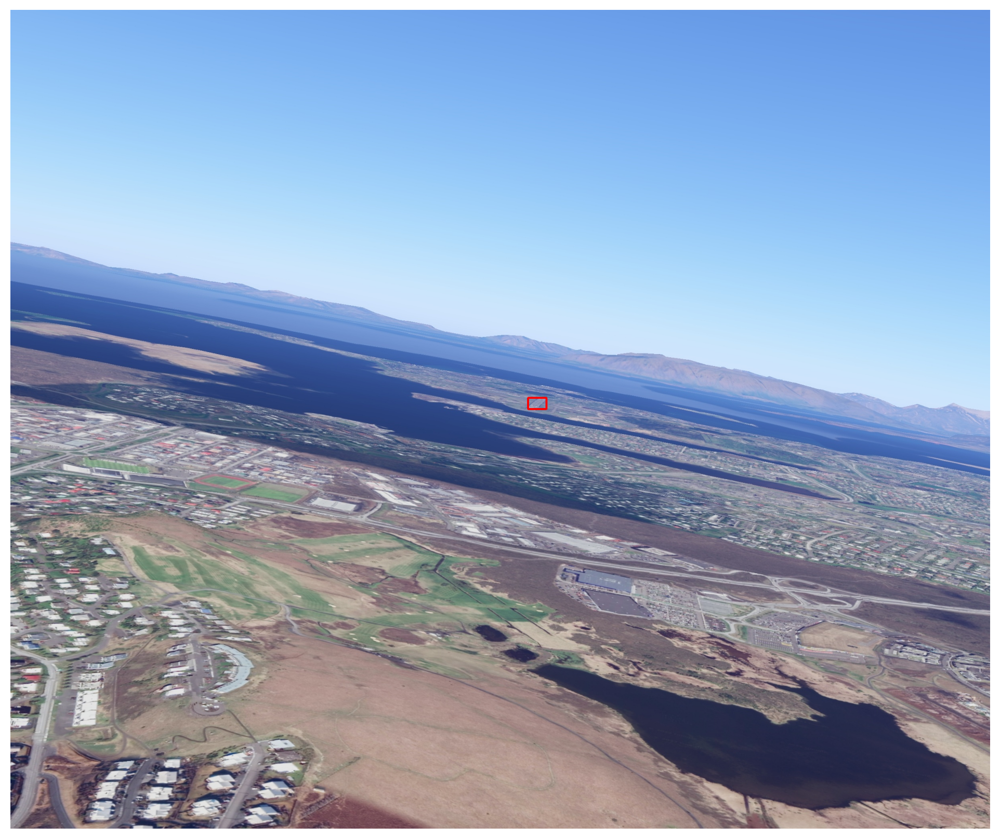

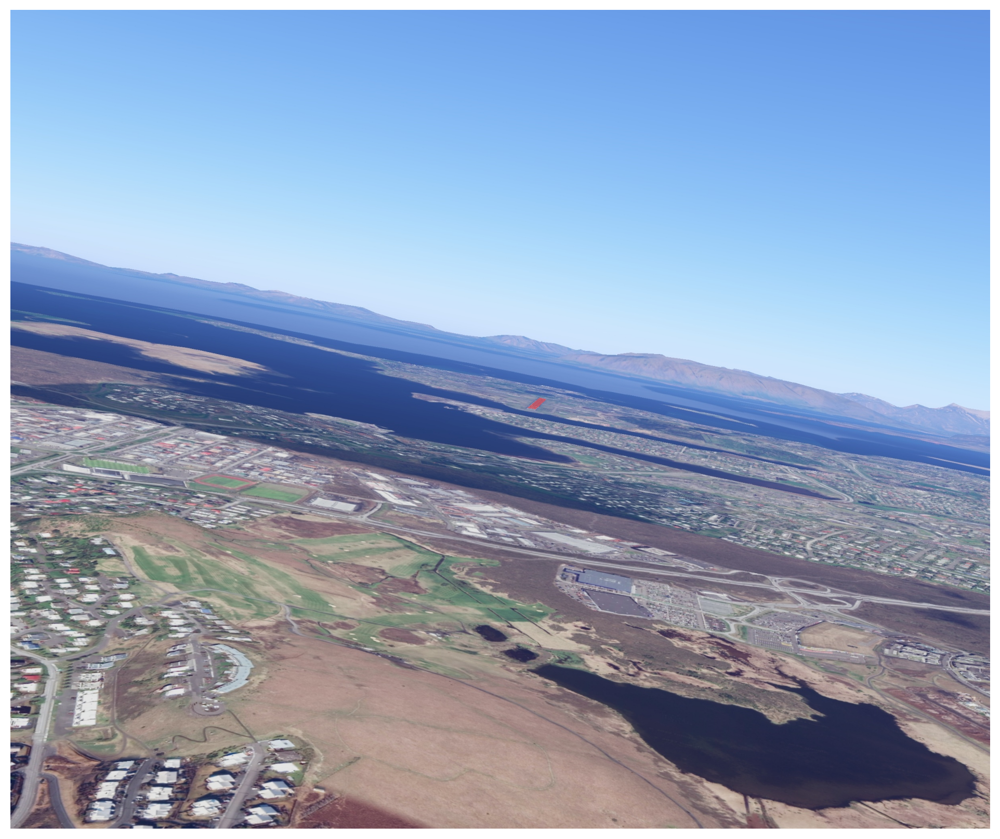

In [20]:
%%time
build("div0", (2448, 2048))

# Train

In [45]:
def train(dataset, task, model, imgsz=2048, batch_size=16, epochs=20):
    data = (datasets_dirpath / dataset / task / "dataset.yaml").as_posix()
    devices = ','.join([str(i) for i in range(torch.cuda.device_count())])
    bs = torch.cuda.device_count() * batch_size
    !yolo {task} train \
        data={data} \
        model={model} \
        epochs={epochs} \
        imgsz={imgsz} \
        batch={bs} \
        device={devices} \
        optimizer=AdamW \
        lr0=0.001 \
        cos_lr=True

## Segment

### From pretrained

In [ ]:
# From pretrained
train("div0", "segment", "yolov8n-seg.pt", batch_size=12)

**Copy paste the run directory (ie `./runs/segment/train`) as `./results/lard/div0/segment/yolov8n/pretrained`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/segment/yolov8n/pretrained/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

Get validation metrics:

In [16]:
!yolo val segment model=./results/lard/div0/segment/yolov8n/pretrained/weights/best.pt data=./datasets/lard/div0/segment/dataset.yaml

Ultralytics YOLOv8.0.31 🚀 Python-3.10.9 torch-1.13.1+cu117 CUDA:0 (NVIDIA A10G, 22564MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs
val: Scanning /aip/datasets/deel/processed/div0/segment/labels/valid.cache... 22
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       2276       2276      0.986      0.967      0.991      0.892      0.978      0.958      0.982      0.763
Speed: 1.6ms pre-process, 15.5ms inference, 0.0ms loss, 1.0ms post-process per image


### From scratch

In [ ]:
# From p
train("div0", "segment", "yolov8n-seg.yaml", batch_size=12, epochs=40)

**Copy paste the run directory (ie `./runs/segment/train`) as `./results/lard/div0/segment/yolov8n/scratch`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/segment/yolov8n/scratch/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

Get validation metrics:

In [17]:
!yolo val segment model=./results/lard/div0/segment/yolov8n/scratch/weights/best.pt data=./datasets/lard/div0/segment/dataset.yaml

Ultralytics YOLOv8.0.31 🚀 Python-3.10.9 torch-1.13.1+cu117 CUDA:0 (NVIDIA A10G, 22564MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs
val: Scanning /aip/datasets/deel/processed/div0/segment/labels/valid.cache... 22
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       2276       2276      0.981      0.944      0.981      0.852      0.972      0.937      0.972      0.732
Speed: 1.4ms pre-process, 15.6ms inference, 0.0ms loss, 0.9ms post-process per image


## Detect

### From pretrained

In [ ]:
# From pretrained
train("div0", "detect", "yolov8n.pt")

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/detect/yolov8n/pretrained`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/detect/yolov8n/pretrained/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

Get validation metrics:

In [19]:
!yolo val detect model=./results/lard/div0/detect/yolov8n/pretrained/weights/best.pt data=./datasets/lard/div0/detect/dataset.yaml

Ultralytics YOLOv8.0.31 🚀 Python-3.10.9 torch-1.13.1+cu117 CUDA:0 (NVIDIA A10G, 22564MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /aip/datasets/deel/processed/div0/detect/labels/valid.cache... 227
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       2276       2276      0.992      0.985      0.994      0.894
Speed: 1.4ms pre-process, 11.8ms inference, 0.0ms loss, 1.1ms post-process per image


### From scratch

In [ ]:
# From scratch
train("div0", "detect", "yolov8n.yaml", epochs=40)

**Copy paste the run directory (ie `./runs/detect/train`) as `./results/lard/div0/detect/yolov8n/scratch`.**

Export in ONNX:

In [ ]:
model = YOLO('./results/lard/div0/detect/yolov8n/scratch/weights/best.pt')
model.fuse()
model.info(verbose=True)
model.export(format="onnx")

Get validation metrics:

In [20]:
!yolo val detect model=./results/lard/div0/detect/yolov8n/scratch/weights/best.pt data=./datasets/lard/div0/detect/dataset.yaml

Ultralytics YOLOv8.0.31 🚀 Python-3.10.9 torch-1.13.1+cu117 CUDA:0 (NVIDIA A10G, 22564MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /aip/datasets/deel/processed/div0/detect/labels/valid.cache... 227
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       2276       2276      0.987      0.946      0.985      0.843
Speed: 1.5ms pre-process, 11.7ms inference, 0.0ms loss, 0.9ms post-process per image


# Results

In [27]:
from markdownTable import markdownTable

results = [
    {
        'task': 'segment',
        'weights': 'pretrained',
        'epochs': 20,
        'mAP50 (%)': 0.991*100,
        'params (M)': 3258259/1000/1000,
        'FLOPs (G)': 12.0,
        'latency (ms)': 15.5
    },
    {
        'task': 'segment',
        'weights': 'scratch',
        'epochs': 40,
        'mAP50 (%)': 0.981*100,
        'params (M)': 3258259/1000/1000,
        'FLOPs (G)': 12.0,
        'latency (ms)': 15.5
    },
    {
        'task': 'detect',
        'weights': 'pretrained',
        'epochs': 20,
        'mAP50 (%)': 0.994*100,
        'params (M)': 3005843/1000/1000,
        'FLOPs (G)': 8.1,
        'latency (ms)': 11.7
    },
    {
        'task': 'detect',
        'weights': 'scratch',
        'epochs': 40,
        'mAP50 (%)': 0.985*100,
        'params (M)': 3005843/1000/1000,
        'FLOPs (G)': 8.1,
        'latency (ms)': 11.7
    },
]

print(markdownTable(results).setParams(row_sep = 'markdown').getMarkdown())

```|  task |  weights |epochs|mAP50 (%)|params (M)|FLOPs (G)|latency (ms)|
|-------|----------|------|---------|----------|---------|------------|
|segment|pretrained|  20  |   99.1  |   3.26   |   12.0  |    15.5    |
|segment|  scratch |  40  |   98.1  |   3.26   |   12.0  |    15.5    |
| detect|pretrained|  20  |   99.4  |   3.01   |   8.1   |    11.7    |
| detect|  scratch |  40  |   98.5  |   3.01   |   8.1   |    11.7    |```
